<a href="https://colab.research.google.com/github/hdaw1905/AI_Microscopy_FoamDynamics/blob/main/notebook/AI_Microscopy_FoamDynamics.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 🔬 Image-Driven Foam Stability Analysis from Microscopy  
## Linking Bubble Dynamics to Foam Stability with Explainable Machine Learning

**Microscopy Hackathon 2025 — AISCIA Informatics Use Case**

**Author:** Hesham Eina Abdalla  
**Background:** Electrical Engineer  | Embedded Systems | PCB Design | AI & IoT Enthusiast | Qatar University Alumni


🔗 **GitHub:** https://github.com/hdaw1905  
🔗 **LinkedIn:** https://www.linkedin.com/in/hesham-eina/



## Executive Summary

This project presents a fully image-driven framework for understanding and comparing foam stability using time-resolved microscopy data. Bubble-level geometric, spatial, and temporal features are extracted directly from segmented microscopy images and analyzed to reveal how microscopic bubble dynamics govern macroscopic foam behavior.

By focusing on interpretable visual descriptors—such as bubble size evolution, population persistence, spatial packing, and size-distribution heterogeneity—this workflow links image-observable patterns to foam stability without relying on chemistry-specific parameters. Explainable machine learning models are then used to quantify the relative importance of these microscopic features and to construct image-derived foam stability proxies.



## End-to-End Image-to-Insight Workflow

This project follows a fully image-first workflow that transforms microscopy observations into physical insight and predictive metrics of foam stability:

**Microscopy Images**  
→ Binary Segmentation of Bubble Regions  
→ Bubble Geometry and Spatial Feature Extraction  
→ Temporal Dynamics Analysis (Coarsening, Entropy, Packing)  
→ Image-Derived Foam Stability Proxies  
→ Explainable Machine Learning  
→ Physical Interpretation of Foam Stability Mechanisms

All results are derived directly from real microscopy images and their time evolution, without using chemical composition or empirical fitting parameters.



In [105]:
# ============================================
# Google Colab Setup: Mount Drive & Set Project Root
# ============================================

from google.colab import drive
import os
from pathlib import Path

drive.mount('/content/drive')

# 👇 DO NOT CHANGE AFTER SUBMISSION
DATA_ROOT = Path("/content/drive/MyDrive/AI_Microscopy_FoamDynamics")

assert DATA_ROOT.exists(), (
    "Dataset folder not found.\n"
    "Expected: /content/drive/MyDrive/AI_Microscopy_FoamDynamics"
)

os.chdir(DATA_ROOT)
ROOT = Path.cwd()

print("Working directory set to:", ROOT)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Working directory set to: /content/drive/MyDrive/AI_Microscopy_FoamDynamics


# AI Microscopy Foam Dynamics — Image-First ML Pipeline

Goal: link bubble patterns in microscopy images to foam stability (coarsening + distributions + collapse),
and compare stability across nanoparticle conditions (baseline vs GO vs NGO).

We use:
- segmented bubble images (binary)
- bubble-center CSVs (x,y per bubble per timestep)
- optional experiment CSVs for reference (breakthrough, mean area, counts)


## Core Scientific Python Libraries


In [106]:
import os
from pathlib import Path
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from skimage import io, measure, morphology
from scipy import stats
from scipy.spatial import cKDTree, Delaunay


## Experiment Configuration and Conditions


In [121]:
ROOT = Path(".").resolve()  # you run notebook inside AI_Microscopy_FoamDynamics

EXPERIMENTS = {
    "E130": {"folder": "Experiment-130", "label": "Surfactant + 150 ppm NP (GO)"},
    "E138": {"folder": "Experiment-138", "label": "Surfactant only (baseline)"},
    "E142": {"folder": "Experiment-142", "label": "Surfactant + 1500 ppm NP (NGO)"},
}

def exp_path(exp_id: str) -> Path:
    return ROOT / EXPERIMENTS[exp_id]["folder"]


## Dataset Path Resolution Utilities


In [108]:
def find_nested_dir(base: Path, name: str) -> Path:
    """
    Finds a directory named `name` inside base, possibly nested one level (like name/name).
    """
    direct = base / name
    if direct.exists():
        # if it contains another same-named folder, prefer that
        nested = direct / name
        return nested if nested.exists() else direct

    # fallback: search
    hits = list(base.rglob(name))
    hits = [h for h in hits if h.is_dir()]
    if not hits:
        raise FileNotFoundError(f"Could not find directory '{name}' under {base}")
    # pick the deepest path (usually base/name/name)
    hits.sort(key=lambda p: len(p.parts), reverse=True)
    return hits[0]

def list_images(seg_dir: Path):
    exts = ("*.png", "*.jpg", "*.jpeg", "*.tif", "*.tiff", "*.bmp")
    files = []
    for e in exts:
        files += list(seg_dir.glob(e))
    files = sorted(files)
    if not files:
        raise FileNotFoundError(f"No images found in {seg_dir}")
    return files

def list_center_csvs(center_dir: Path):
    csvs = sorted(center_dir.glob("*.csv"))
    if not csvs:
        raise FileNotFoundError(f"No center CSVs found in {center_dir}")
    return csvs


## Dataset Inventory and Consistency Check



In [109]:
for exp_id in EXPERIMENTS:
    p = exp_path(exp_id)

    seg_dir = find_nested_dir(p, "Segmented_pictures")
    cen_dir = find_nested_dir(p, "bubbles_center")

    imgs = list_images(seg_dir)
    csvs = list_center_csvs(cen_dir)

    print(exp_id, "-", EXPERIMENTS[exp_id]["label"])
    print("  Segmented images:", seg_dir, "count:", len(imgs))
    print("  Center CSVs:", cen_dir, "count:", len(csvs))


E130 - Surfactant + 150 ppm NP (GO?)
  Segmented images: /content/drive/MyDrive/AI_Microscopy_FoamDynamics/Experiment-130/Segmented_pictures/Segmented_pictures count: 166
  Center CSVs: /content/drive/MyDrive/AI_Microscopy_FoamDynamics/Experiment-130/bubbles_center/bubbles_center count: 166
E138 - Surfactant only (baseline)
  Segmented images: /content/drive/MyDrive/AI_Microscopy_FoamDynamics/Experiment-138/Segmented_pictures/Segmented_pictures count: 149
  Center CSVs: /content/drive/MyDrive/AI_Microscopy_FoamDynamics/Experiment-138/bubbles_center/bubbles_center count: 470
E142 - Surfactant + 1500 ppm NP (NGO?)
  Segmented images: /content/drive/MyDrive/AI_Microscopy_FoamDynamics/Experiment-142/Segmented_pictures/Segmented_pictures count: 188
  Center CSVs: /content/drive/MyDrive/AI_Microscopy_FoamDynamics/Experiment-142/bubbles_center/bubbles_center count: 188


## Visual Sanity Check: Segmented Microscopy Frames



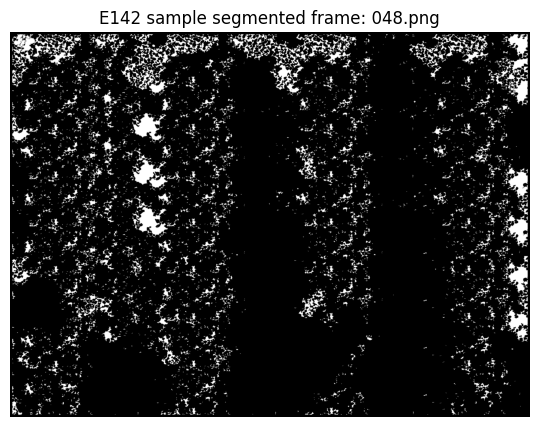

Unique values: [  0 255]  ...


In [110]:
exp_id = "E142"  # change to E138/E130 to compare
seg_dir = find_nested_dir(exp_path(exp_id), "Segmented_pictures")
imgs = list_images(seg_dir)

img0 = io.imread(imgs[0])
plt.figure(figsize=(10,5))
plt.imshow(img0, cmap="gray")
plt.title(f"{exp_id} sample segmented frame: {imgs[0].name}")
plt.axis("off")
plt.show()

print("Unique values:", np.unique(img0)[:10], " ...")


## Image-to-Binary Mask Conversion and Cleaning



E130 - Surfactant + 150 ppm NP (GO?)
  Segmented images: /content/drive/MyDrive/AI_Microscopy_FoamDynamics/Experiment-130/Segmented_pictures/Segmented_pictures count: 166
  Center CSVs: /content/drive/MyDrive/AI_Microscopy_FoamDynamics/Experiment-130/bubbles_center/bubbles_center count: 166


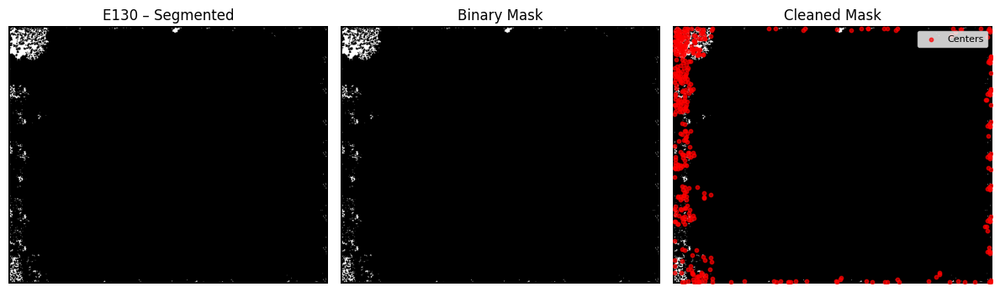

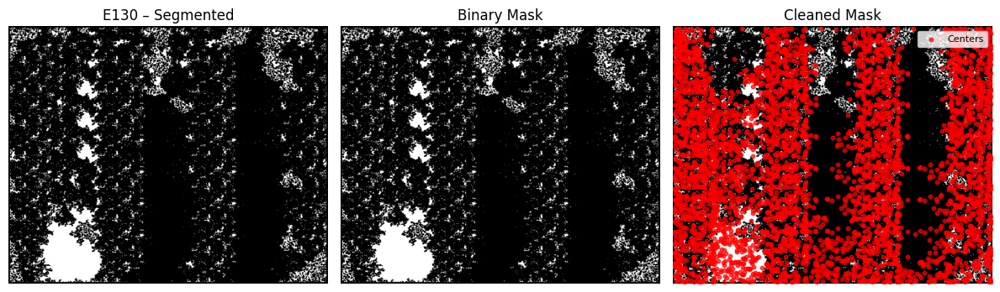

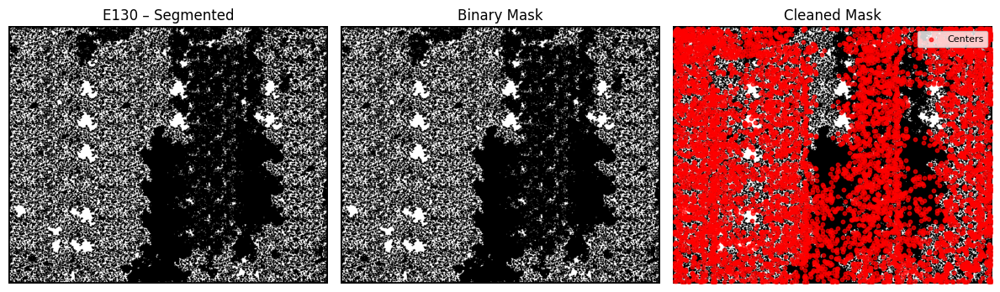

E138 - Surfactant only (baseline)
  Segmented images: /content/drive/MyDrive/AI_Microscopy_FoamDynamics/Experiment-138/Segmented_pictures/Segmented_pictures count: 149
  Center CSVs: /content/drive/MyDrive/AI_Microscopy_FoamDynamics/Experiment-138/bubbles_center/bubbles_center count: 470


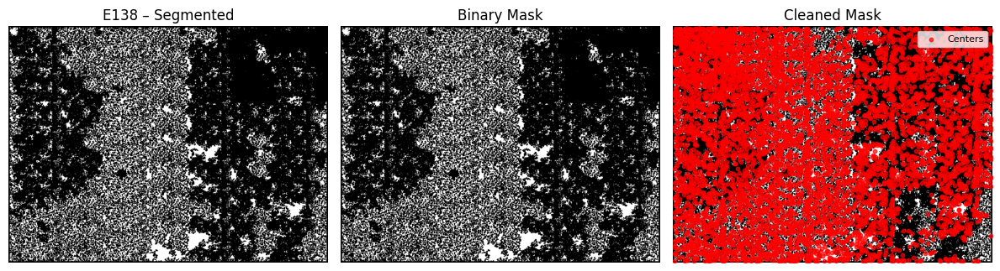

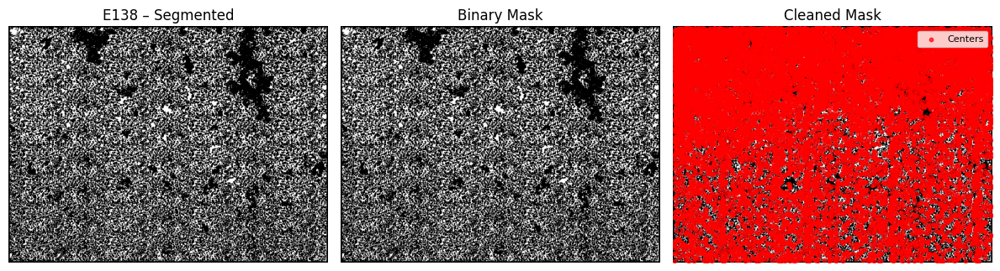

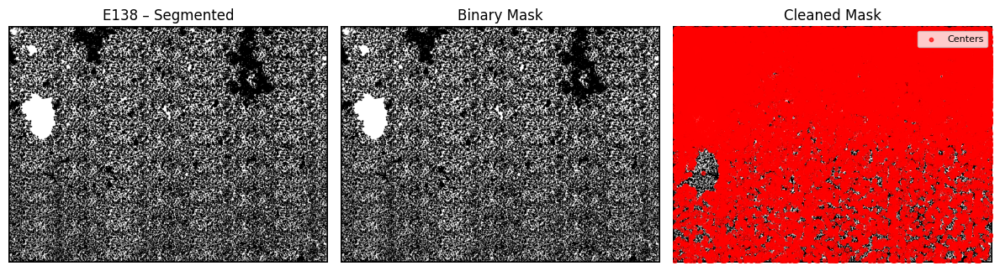

E142 - Surfactant + 1500 ppm NP (NGO?)
  Segmented images: /content/drive/MyDrive/AI_Microscopy_FoamDynamics/Experiment-142/Segmented_pictures/Segmented_pictures count: 188
  Center CSVs: /content/drive/MyDrive/AI_Microscopy_FoamDynamics/Experiment-142/bubbles_center/bubbles_center count: 188


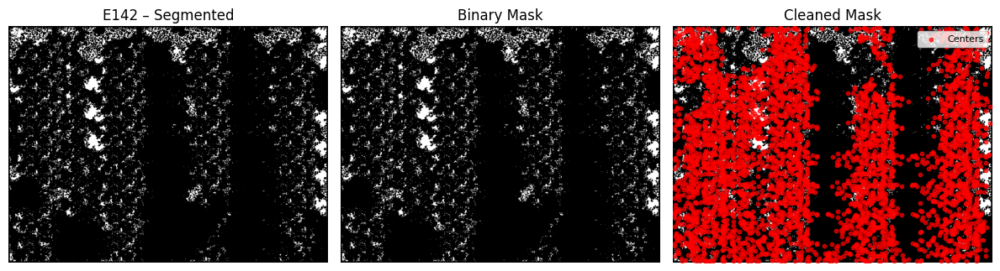

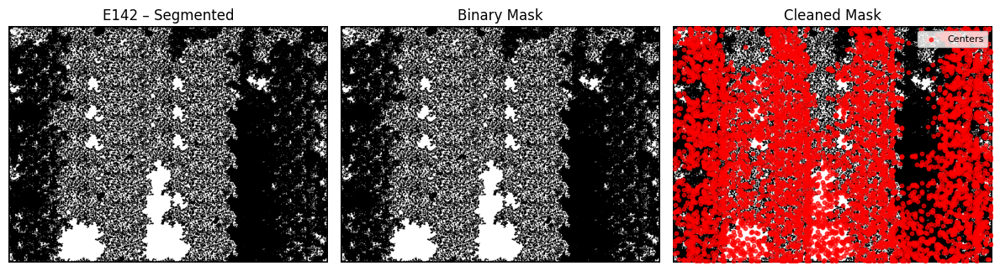

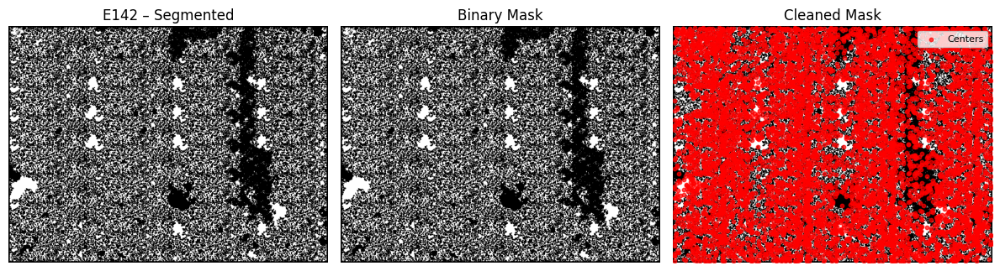

In [113]:
import matplotlib.pyplot as plt
from skimage.io import imread
import pandas as pd

MAX_SHOW = 3  # how many frames to visualize per experiment

for exp_id in EXPERIMENTS:
    p = exp_path(exp_id)

    seg_dir = find_nested_dir(p, "Segmented_pictures")
    cen_dir = find_nested_dir(p, "bubbles_center")

    imgs = list_images(seg_dir)
    csvs = list_center_csvs(cen_dir)

    print("=" * 60)
    print(exp_id, "-", EXPERIMENTS[exp_id]["label"])
    print("  Segmented images:", seg_dir, "count:", len(imgs))
    print("  Center CSVs:", cen_dir, "count:", len(csvs))

    # --- visualize a few frames ---
    for i in range(min(MAX_SHOW, len(imgs))):
        img = imread(imgs[i])
        binary = to_binary(img, show=False)
        cleaned = clean_mask(binary, show=False)

        fig, ax = plt.subplots(1, 3, figsize=(12, 4))

        ax[0].imshow(img, cmap="gray")
        ax[0].set_title(f"{exp_id} – Segmented")
        ax[0].axis("off")

        ax[1].imshow(binary, cmap="gray")
        ax[1].set_title("Binary Mask")
        ax[1].axis("off")

        ax[2].imshow(cleaned, cmap="gray")
        ax[2].set_title("Cleaned Mask")
        ax[2].axis("off")

        # --- overlay bubble centers if available ---
        if i < len(csvs):
            centers = pd.read_csv(csvs[i])
            if {"x", "y"}.issubset(centers.columns):
                ax[2].scatter(
                    centers["x"],
                    centers["y"],
                    s=10,
                    c="red",
                    alpha=0.7,
                    label="Centers"
                )
                ax[2].legend(loc="upper right", fontsize=8)

        plt.tight_layout()
        plt.show()


## Bubble Geometry Feature Extraction (Region-Based)


In [114]:
from skimage.measure import label
import numpy as np

def image_region_features(mask, bins=30):
    """
    Fast region stats from labeled mask, with interpretable distribution metrics.
    """
    lbl = label(mask)
    areas = np.bincount(lbl.ravel())[1:]  # skip background
    if len(areas) == 0:
        return {
            "n_bubbles_img": 0,
            "area_mean": np.nan,
            "area_median": np.nan,
            "area_std": np.nan,
            "area_q10": np.nan,
            "area_q90": np.nan,
            "area_iqr": np.nan,
            "area_cv": np.nan,
            "entropy_area": np.nan,
            "gini_area": np.nan,
        }

    areas = areas.astype(float)

    # robust stats
    q10, q50, q90 = np.percentile(areas, [10, 50, 90])
    iqr = np.percentile(areas, 75) - np.percentile(areas, 25)
    cv = areas.std() / (areas.mean() + 1e-9)

    # histogram entropy (probabilities, not density)
    hist = np.histogram(areas, bins=bins)[0].astype(float)
    p = hist / (hist.sum() + 1e-12)
    entropy = -np.sum(p * np.log(p + 1e-12))

    # Gini coefficient (inequality in bubble sizes)
    a = np.sort(areas)
    n = len(a)
    gini = (2*np.sum((np.arange(1, n+1))*a) / (n*np.sum(a)+1e-12)) - (n+1)/n

    return {
        "n_bubbles_img": int(len(areas)),
        "area_mean": float(areas.mean()),
        "area_median": float(q50),
        "area_std": float(areas.std()),
        "area_q10": float(q10),
        "area_q90": float(q90),
        "area_iqr": float(iqr),
        "area_cv": float(cv),
        "entropy_area": float(entropy),
        "gini_area": float(gini),
    }


## Spatial Feature Extraction from Bubble Centers


In [115]:
def read_centers(csv_path: Path):
    df = pd.read_csv(csv_path)
    # handle cases: columns might be ["x", "y"] or single column
    cols = [c.strip().lower() for c in df.columns]
    if len(cols) >= 2:
        x = pd.to_numeric(df.iloc[:,0], errors="coerce").to_numpy()
        y = pd.to_numeric(df.iloc[:,1], errors="coerce").to_numpy()
    else:
        # fallback if file is weirdly formatted
        txt = csv_path.read_text().strip().splitlines()
        pts = []
        for line in txt:
            parts = re.split(r"[,\s]+", line.strip())
            if len(parts) >= 2:
                pts.append((float(parts[0]), float(parts[1])))
        arr = np.array(pts, float)
        x, y = arr[:,0], arr[:,1]

    pts = np.vstack([x, y]).T
    pts = pts[np.isfinite(pts).all(axis=1)]
    return pts


In [116]:
def center_spatial_features(pts, k=6):
    """
    Fast spatial features from bubble centers.
    Uses kNN distances only (Delaunay removed for speed).
    """
    if pts.shape[0] < k + 1:
        return {
            "n_centers": int(pts.shape[0]),
            "knn_dist_mean": np.nan,
            "knn_dist_std": np.nan,
            "knn_dist_cv": np.nan,
        }

    tree = cKDTree(pts)
    dists, _ = tree.query(pts, k=k+1)
    knn = dists[:, 1:]

    return {
        "n_centers": int(pts.shape[0]),
        "knn_dist_mean": float(knn.mean()),
        "knn_dist_std": float(knn.std()),
        "knn_dist_cv": float(knn.std() / (knn.mean() + 1e-9)),
    }


## Frame-Level Feature Assembly (Geometry + Spatial)




In [117]:
def extract_frame_features(img_path: Path, center_csv_path: Path):
    img = io.imread(img_path)
    mask = clean_mask(to_binary(img), min_size=25)

    geom = image_region_features(mask)

    pts = read_centers(center_csv_path)
    spatial = center_spatial_features(pts, k=6)

    feats = {}
    feats.update(geom)
    feats.update(spatial)
    return feats


## Time-Series Feature Construction and I/O Optimization


In [122]:
from pathlib import Path
import shutil, os, time

FULL_FRAMES = True
FRAME_STRIDE = 1 if FULL_FRAMES else 5

# Copy dataset from Drive to local runtime disk for FAST I/O
COPY_TO_LOCAL = True

DRIVE_ROOT = ROOT  # currently /content/drive/MyDrive/AI_Microscopy_FoamDynamics
LOCAL_ROOT = Path("/content/AI_Microscopy_FoamDynamics")

if COPY_TO_LOCAL:
    if not LOCAL_ROOT.exists():
        print("Copying dataset to local disk (one-time)...")
        t0 = time.time()
        shutil.copytree(DRIVE_ROOT, LOCAL_ROOT)
        print("Done. Copy time (s):", round(time.time() - t0, 2))
    else:
        print("Local dataset already exists:", LOCAL_ROOT)

    WORK_ROOT = LOCAL_ROOT
else:
    WORK_ROOT = DRIVE_ROOT

print("WORK_ROOT =", WORK_ROOT)
print("FRAME_STRIDE =", FRAME_STRIDE)


Local dataset already exists: /content/AI_Microscopy_FoamDynamics
WORK_ROOT = /content/AI_Microscopy_FoamDynamics
FRAME_STRIDE = 1


In [89]:
import pandas as pd
from tqdm.auto import tqdm

def exp_path_work(exp_id: str) -> Path:
    return WORK_ROOT / EXPERIMENTS[exp_id]["folder"]

CACHE_DIR = WORK_ROOT / "_cache_features"
CACHE_DIR.mkdir(exist_ok=True)

def build_experiment_timeseries(exp_id: str):
    # cache file per experiment
    cache_path = CACHE_DIR / f"{exp_id}_features_stride{FRAME_STRIDE}.parquet"
    if cache_path.exists():
        print(f"  ↩ Loading cached features: {cache_path.name}")
        return pd.read_parquet(cache_path)

    p = exp_path_work(exp_id)
    seg_dir = find_nested_dir(p, "Segmented_pictures")
    cen_dir = find_nested_dir(p, "bubbles_center")

    imgs = list_images(seg_dir)
    csvs = list_center_csvs(cen_dir)

    n_total = min(len(imgs), len(csvs))
    imgs = imgs[:n_total:FRAME_STRIDE]
    csvs = csvs[:n_total:FRAME_STRIDE]

    rows = []
    for i, (im, cc) in enumerate(tqdm(list(zip(imgs, csvs)),
                                     desc=f"{exp_id} frames",
                                     total=len(imgs))):

        f = extract_frame_features(im, cc)

        # Keep BOTH: subsampled index and original index
        f["t"] = i                      # subsampled step index
        f["t_raw"] = i * FRAME_STRIDE   # original frame index (FULL_FRAMES -> same)
        f["img_name"] = im.name
        f["center_csv"] = cc.name
        f["experiment"] = exp_id

        rows.append(f)

    df = pd.DataFrame(rows).sort_values("t_raw").reset_index(drop=True)
    df.to_parquet(cache_path, index=False)
    print(f"  💾 Saved cache: {cache_path.name}")
    return df

# Build all experiments
series = {}
for exp_id in EXPERIMENTS:
    print(f"\n▶ Building: {exp_id} — {EXPERIMENTS[exp_id]['label']}")
    series[exp_id] = build_experiment_timeseries(exp_id)

series["E142"].head()



▶ Building: E130 — Surfactant + 150 ppm NP (GO?)
  ↩ Loading cached features: E130_features_stride1.parquet

▶ Building: E138 — Surfactant only (baseline)
  ↩ Loading cached features: E138_features_stride1.parquet

▶ Building: E142 — Surfactant + 1500 ppm NP (NGO?)
  ↩ Loading cached features: E142_features_stride1.parquet


,n_bubbles_img,area_mean,area_std,entropy_area,n_centers,knn_dist_mean,knn_dist_std,knn_dist_cv,t,t_raw,img_name,center_csv,experiment
0,3487,610.225409,3405.901434,0.002190,4094,67.017360,32.553998,0.485755,0,0,048.png,Experiment-142_t048.csv,E142
1,4554,1452.610233,25332.795098,0.000218,5457,60.581081,29.020173,0.479030,1,1,049.png,Experiment-142_t049.csv,E142
2,5970,1425.749079,23840.023002,0.000215,7150,55.234397,24.935285,0.451445,2,2,050.png,Experiment-142_t050.csv,E142
3,11753,659.251851,3156.868189,0.000996,13477,40.507544,18.004972,0.444484,3,3,051.png,Experiment-142_t051.csv,E142
4,18836,379.954024,2560.559145,0.001005,21058,33.397725,13.963884,0.418109,4,4,052.png,Experiment-142_t052.csv,E142


## Temporal Evolution of Bubble Dynamics


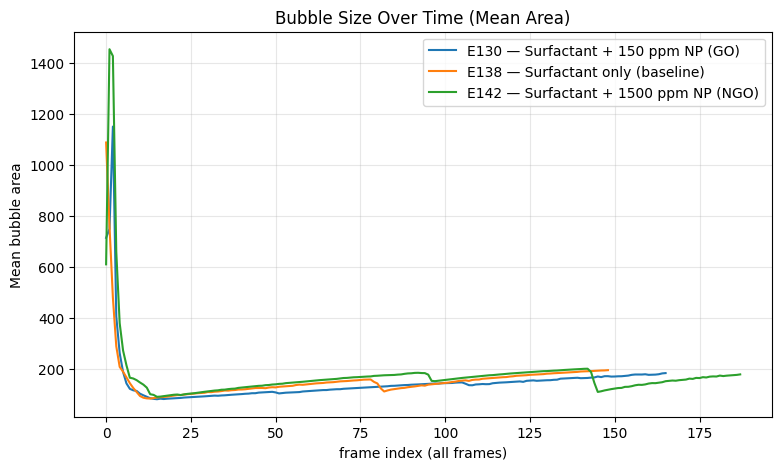

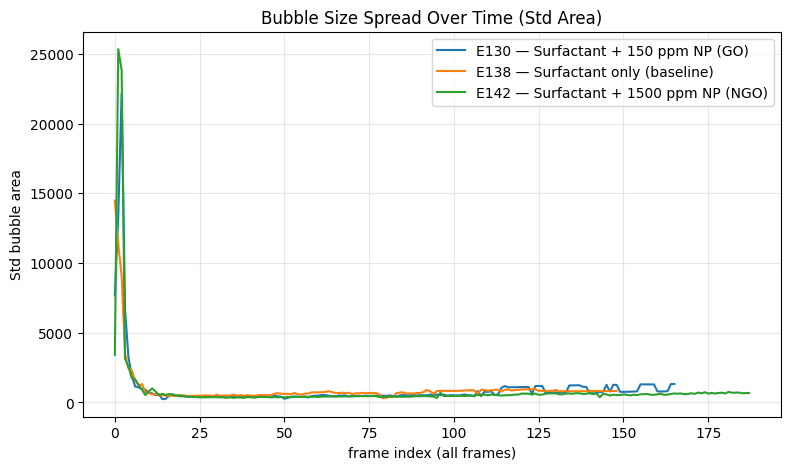

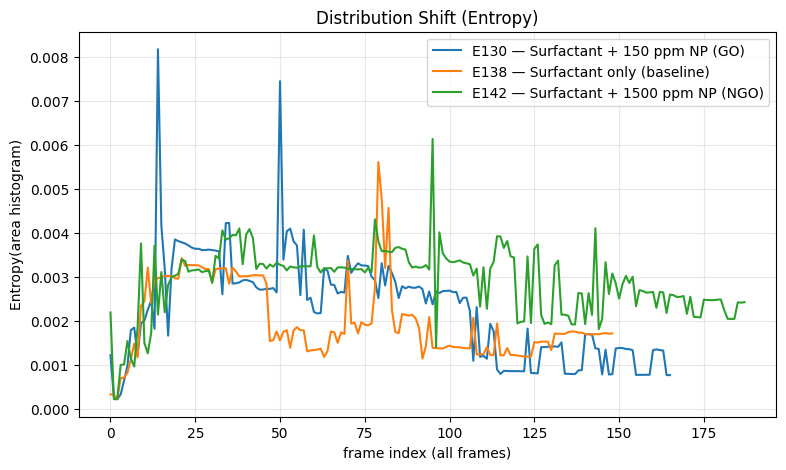

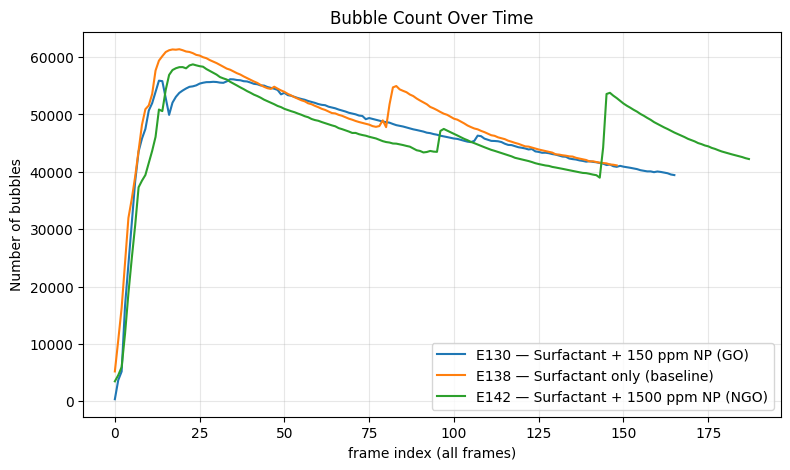

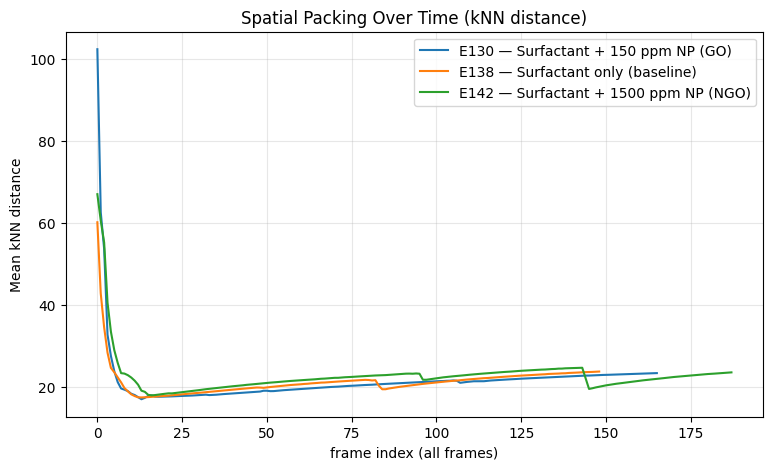

In [123]:

import matplotlib.pyplot as plt

def plot_timeseries(metric, title, ylabel):
    if metric not in next(iter(series.values())).columns:
        print(f"[SKIP] '{metric}' not found.")
        return

    plt.figure(figsize=(9,5))
    for exp_id, df in series.items():
        plt.plot(df["t_raw"], df[metric], label=f"{exp_id} — {EXPERIMENTS[exp_id]['label']}")
    plt.title(title)
    plt.xlabel("frame index (all frames)")
    plt.ylabel(ylabel)
    plt.grid(True, alpha=0.3)
    plt.legend()
    plt.show()

plot_timeseries("area_mean", "Bubble Size Over Time (Mean Area)", "Mean bubble area")
plot_timeseries("area_std", "Bubble Size Spread Over Time (Std Area)", "Std bubble area")
plot_timeseries("entropy_area", "Distribution Shift (Entropy)", "Entropy(area histogram)")
plot_timeseries("n_bubbles_img", "Bubble Count Over Time", "Number of bubbles")
plot_timeseries("knn_dist_mean", "Spatial Packing Over Time (kNN distance)", "Mean kNN distance")


## Quantification of Coarsening and Bubble Loss Rates

In [124]:

import numpy as np
import pandas as pd

def robust_slope(x, y):
    x = np.asarray(x, float)
    y = np.asarray(y, float)
    m = np.isfinite(x) & np.isfinite(y)
    if m.sum() < 10:
        return np.nan
    return float(np.polyfit(x[m], y[m], 1)[0])

def summarize_dynamics(df, early_frac=0.25):
    n = len(df)
    k = max(10, int(n * early_frac))

    x = df["t_raw"].values  # use full-frame index
    out = {"n_frames": n}

    out["coarsening_rate_full"]  = robust_slope(x, df["area_mean"].values)
    out["coarsening_rate_early"] = robust_slope(x[:k], df["area_mean"].values[:k])

    out["bubble_loss_rate_full"]  = robust_slope(x, df["n_bubbles_img"].values)
    out["bubble_loss_rate_early"] = robust_slope(x[:k], df["n_bubbles_img"].values[:k])

    out["entropy_rate_full"]  = robust_slope(x, df["entropy_area"].values)
    out["entropy_rate_early"] = robust_slope(x[:k], df["entropy_area"].values[:k])

    out["packing_rate_full"] = robust_slope(x, df["knn_dist_mean"].values)

    return out

rows = []
for exp_id, df in series.items():
    s = summarize_dynamics(df)
    s["experiment"] = exp_id
    s["condition"] = EXPERIMENTS[exp_id]["label"]
    rows.append(s)

dyn_df = pd.DataFrame(rows)
dyn_df


,n_frames,coarsening_rate_full,coarsening_rate_early,bubble_loss_rate_full,bubble_loss_rate_early,entropy_rate_full,entropy_rate_early,packing_rate_full,experiment,condition
0,166,-0.038005,-9.419100,-47.282344,925.770557,-0.000014,0.000066,-0.004597,E130,Surfactant + 150 ppm NP (GO)
1,149,-0.005572,-9.541321,-58.661763,1023.977477,-0.000007,0.000078,0.010244,E138,Surfactant only (baseline)
2,188,-0.406061,-10.169654,-10.357937,784.922988,-0.000002,0.000062,-0.009692,E142,Surfactant + 1500 ppm NP (NGO)


## Image-Derived Foam Stability Proxy




In [125]:

def stability_proxy(df, col="n_bubbles_img"):
    y = df[col].values.astype(float)
    if len(y) < 10 or not np.isfinite(y[0]) or y[0] <= 0:
        return np.nan

    y_norm = y / y[0]
    x = df["t_raw"].values.astype(float)

    # Area under normalized curve vs time
    return float(np.trapezoid(y_norm, x))

hl_df = pd.DataFrame([
    {
        "experiment": exp_id,
        "condition": EXPERIMENTS[exp_id]["label"],
        "foam_stability_proxy": stability_proxy(df),
    }
    for exp_id, df in series.items()
])

hl_df


,experiment,condition,foam_stability_proxy
0,E130,Surfactant + 150 ppm NP (GO),20991.948370
1,E138,Surfactant only (baseline),1406.198408
2,E142,Surfactant + 1500 ppm NP (NGO),2478.400631


## Visual Dashboard: Images + Dynamics (All Experiments)


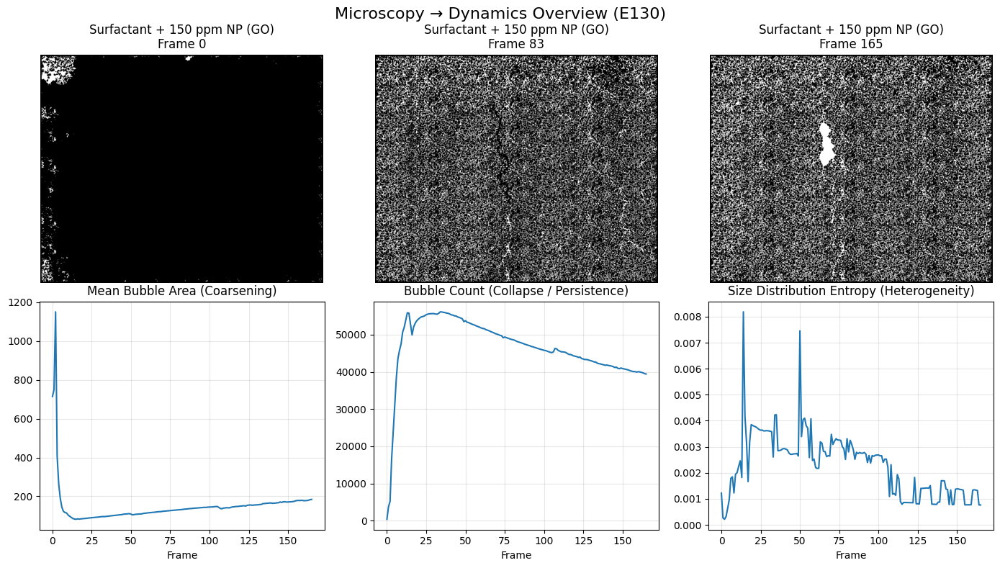

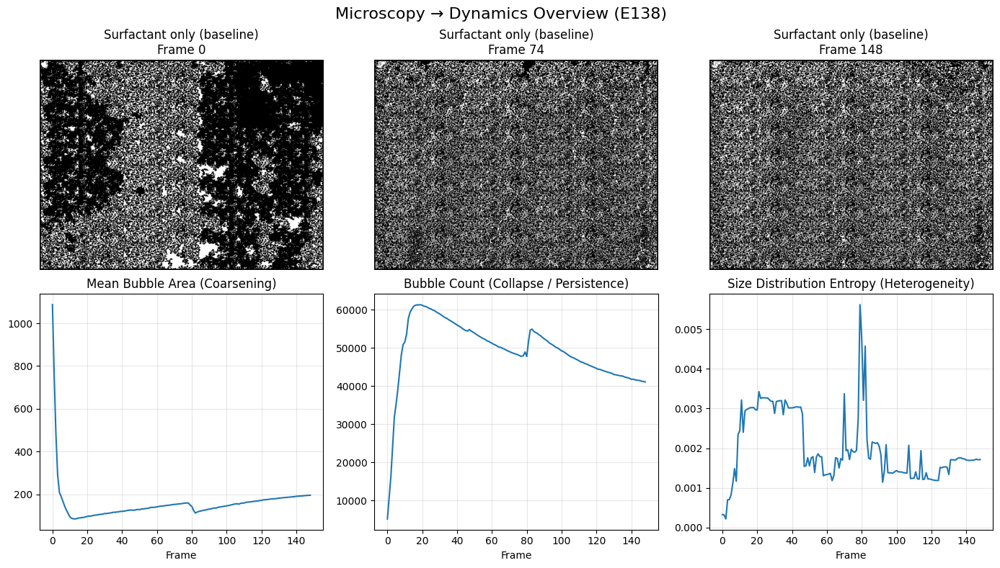

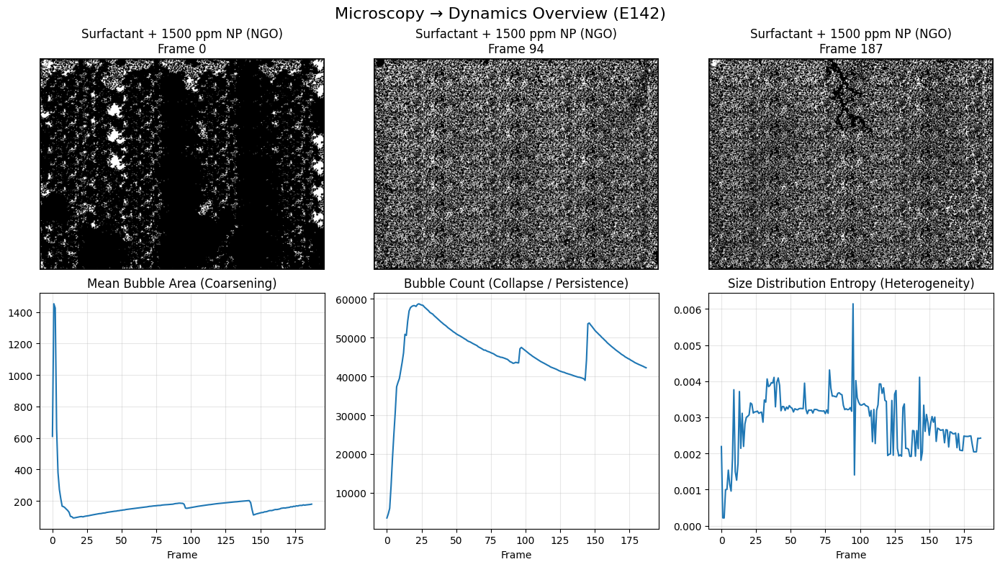

In [126]:

import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

def show_dashboard(exp_id):
    df = series[exp_id]
    label_txt = EXPERIMENTS[exp_id]["label"]

    seg_dir = find_nested_dir(exp_path_work(exp_id), "Segmented_pictures")

    # choose representative frames: start / mid / end
    idxs = [0, len(df)//2, len(df)-1]
    imgs = [Image.open(seg_dir / df.iloc[i]["img_name"]) for i in idxs]

    fig = plt.figure(figsize=(14, 8))
    gs = fig.add_gridspec(2, 3, height_ratios=[1, 1])

    # --- row 1: images ---
    for j, (i, im) in enumerate(zip(idxs, imgs)):
        ax = fig.add_subplot(gs[0, j])
        ax.imshow(im, cmap="gray")
        ax.set_title(f"{label_txt}\nFrame {int(df.iloc[i]['t_raw'])}")
        ax.axis("off")

    # --- row 2: curves ---
    ax1 = fig.add_subplot(gs[1, 0])
    ax1.plot(df["t_raw"], df["area_mean"])
    ax1.set_title("Mean Bubble Area (Coarsening)")
    ax1.set_xlabel("Frame"); ax1.grid(alpha=0.3)

    ax2 = fig.add_subplot(gs[1, 1])
    ax2.plot(df["t_raw"], df["n_bubbles_img"])
    ax2.set_title("Bubble Count (Collapse / Persistence)")
    ax2.set_xlabel("Frame"); ax2.grid(alpha=0.3)

    ax3 = fig.add_subplot(gs[1, 2])
    ax3.plot(df["t_raw"], df["entropy_area"])
    ax3.set_title("Size Distribution Entropy (Heterogeneity)")
    ax3.set_xlabel("Frame"); ax3.grid(alpha=0.3)

    fig.suptitle(f"Microscopy → Dynamics Overview ({exp_id})", fontsize=16)
    plt.tight_layout()
    plt.show()

for exp_id in EXPERIMENTS:
    show_dashboard(exp_id)


### “All experiments” overlay with uncertainty bands

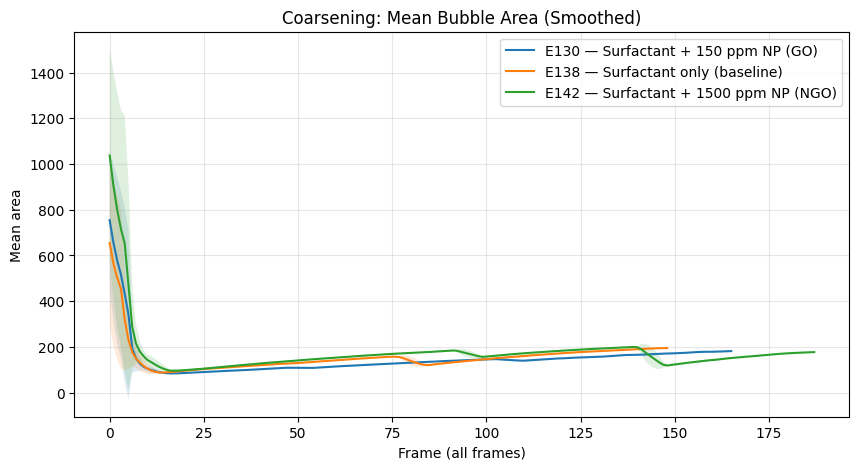

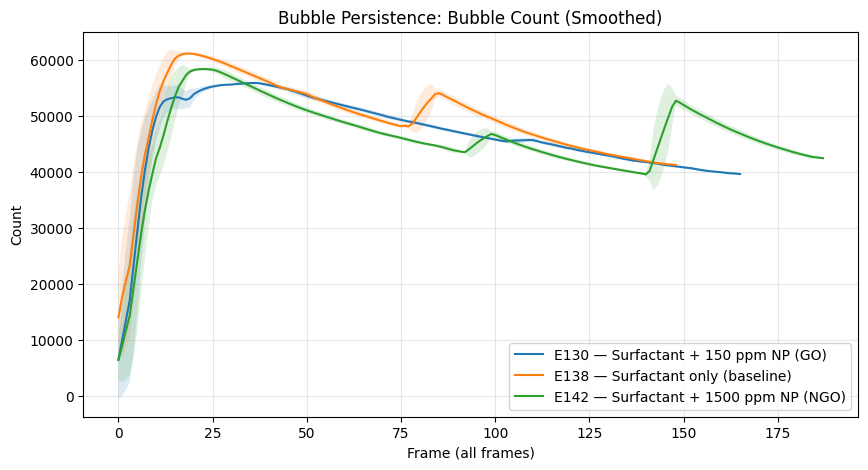

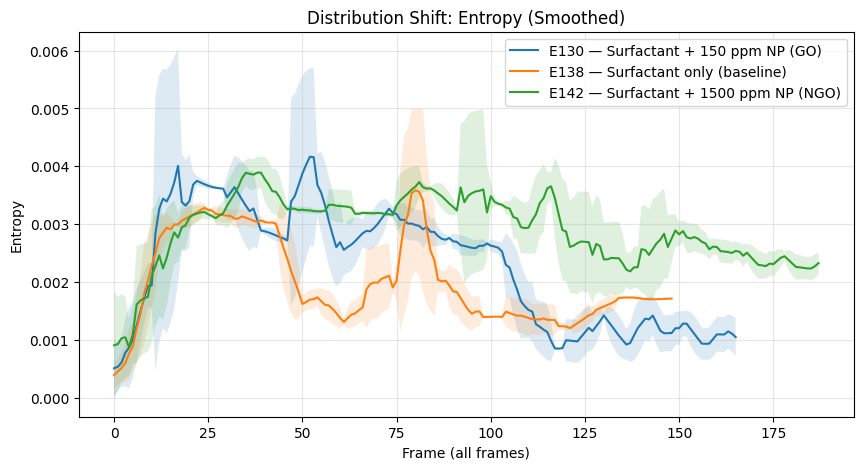

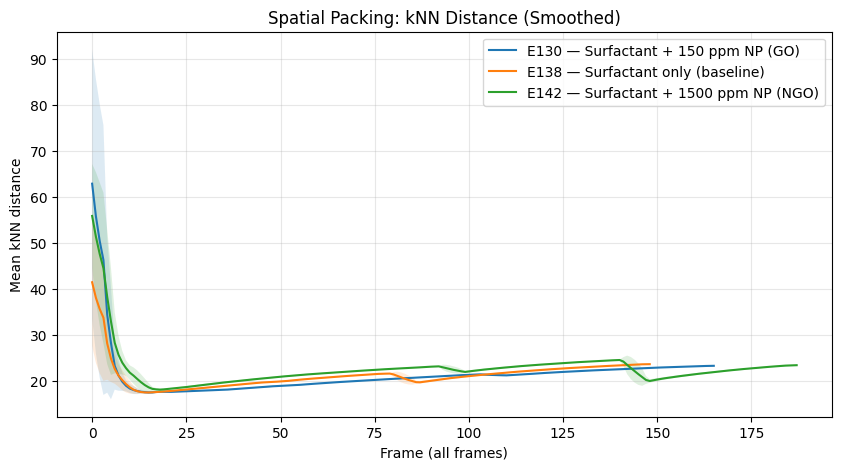

In [127]:

import pandas as pd
import matplotlib.pyplot as plt

def plot_with_band(metric, title, ylabel, window=7):
    plt.figure(figsize=(10,5))

    for exp_id, df in series.items():
        s = df[metric].astype(float)
        mu = s.rolling(window, center=True, min_periods=1).mean()
        sd = s.rolling(window, center=True, min_periods=1).std()

        plt.plot(df["t_raw"], mu, label=f"{exp_id} — {EXPERIMENTS[exp_id]['label']}")
        plt.fill_between(df["t_raw"], mu - sd, mu + sd, alpha=0.15)

    plt.title(title)
    plt.xlabel("Frame (all frames)")
    plt.ylabel(ylabel)
    plt.grid(alpha=0.3)
    plt.legend()
    plt.show()

plot_with_band("area_mean", "Coarsening: Mean Bubble Area (Smoothed)", "Mean area")
plot_with_band("n_bubbles_img", "Bubble Persistence: Bubble Count (Smoothed)", "Count")
plot_with_band("entropy_area", "Distribution Shift: Entropy (Smoothed)", "Entropy")
plot_with_band("knn_dist_mean", "Spatial Packing: kNN Distance (Smoothed)", "Mean kNN distance")


### Real-image distribution evolution (start/mid/end histograms)

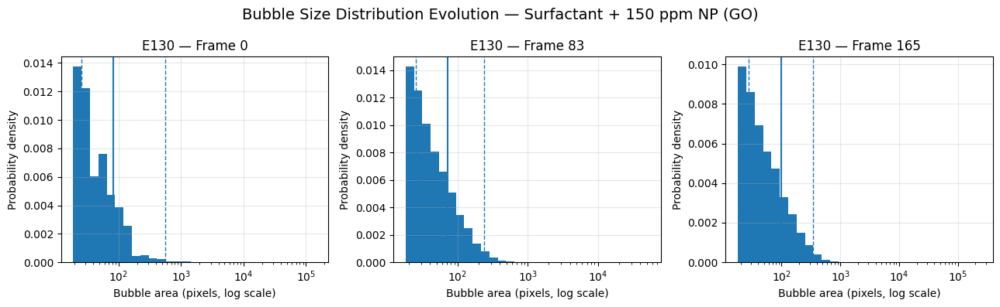

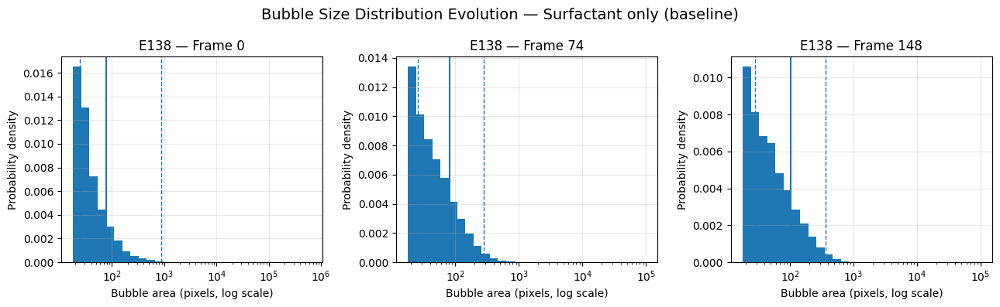

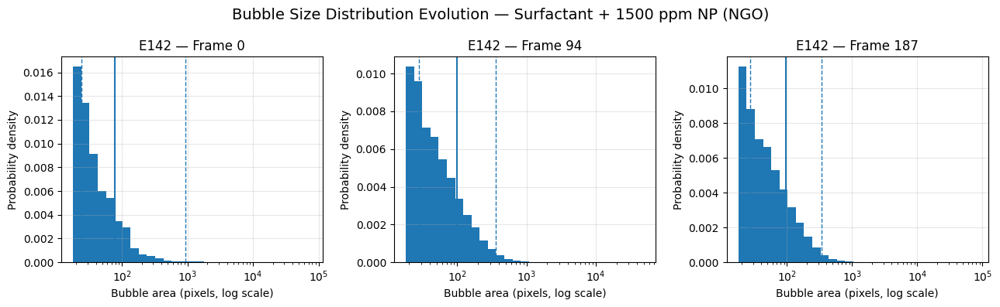

In [128]:

import numpy as np
import matplotlib.pyplot as plt
from skimage.measure import label, regionprops
from PIL import Image

def get_areas_from_segmented_image(img_path):
    """
    Compute bubble areas directly from a segmented (binary) image.
    """
    img = Image.open(img_path).convert("L")
    arr = np.array(img)

    # assume bubbles are white on black
    mask = arr > 0

    lbl = label(mask)
    props = regionprops(lbl)

    areas = np.array([p.area for p in props], dtype=float)
    return areas

def plot_distribution_evolution(exp_id):
    df = series[exp_id]
    seg_dir = find_nested_dir(exp_path_work(exp_id), "Segmented_pictures")

    idxs = [0, len(df)//2, len(df)-1]
    plt.figure(figsize=(13,4))

    for j, i in enumerate(idxs, 1):
        img_path = seg_dir / df.iloc[i]["img_name"]
        areas = get_areas_from_segmented_image(img_path)

        plt.subplot(1,3,j)

        if len(areas) == 0:
            plt.title("No bubbles detected")
            continue

        bins = np.logspace(np.log10(areas.min()+1),
                           np.log10(areas.max()+1),
                           30)

        plt.hist(areas, bins=bins, density=True)
        plt.xscale("log")

        p10, p50, p90 = np.percentile(areas, [10, 50, 90])
        plt.axvline(p10, linestyle="--", linewidth=1)
        plt.axvline(p50, linestyle="-",  linewidth=1.5)
        plt.axvline(p90, linestyle="--", linewidth=1)

        plt.title(f"{exp_id} — Frame {int(df.iloc[i]['t_raw'])}")
        plt.xlabel("Bubble area (pixels, log scale)")
        plt.ylabel("Probability density")
        plt.grid(alpha=0.3)

    plt.suptitle(
        f"Bubble Size Distribution Evolution — {EXPERIMENTS[exp_id]['label']}",
        fontsize=14
    )
    plt.tight_layout()
    plt.show()

for exp_id in EXPERIMENTS:
    plot_distribution_evolution(exp_id)


## Explainable Machine Learning for Foam Stability Prediction


### Predicting Foam Stability from Images

In [129]:

ml_df = dyn_df.merge(
    hl_df[["experiment", "foam_stability_proxy"]],
    on="experiment",
    how="left"
)

ml_df = ml_df.sort_values("foam_stability_proxy", ascending=False)
ml_df


,n_frames,coarsening_rate_full,coarsening_rate_early,bubble_loss_rate_full,bubble_loss_rate_early,entropy_rate_full,entropy_rate_early,packing_rate_full,experiment,condition,foam_stability_proxy
0,166,-0.038005,-9.419100,-47.282344,925.770557,-0.000014,0.000066,-0.004597,E130,Surfactant + 150 ppm NP (GO),20991.948370
2,188,-0.406061,-10.169654,-10.357937,784.922988,-0.000002,0.000062,-0.009692,E142,Surfactant + 1500 ppm NP (NGO),2478.400631
1,149,-0.005572,-9.541321,-58.661763,1023.977477,-0.000007,0.000078,0.010244,E138,Surfactant only (baseline),1406.198408


### Normalize features (important for ML & fairness)

In [130]:

from sklearn.preprocessing import StandardScaler

FEATURES = [
    "coarsening_rate_early",
    "bubble_loss_rate_early",
    "entropy_rate_early",
    "packing_rate_full",
]

X = ml_df[FEATURES].values
y = ml_df["foam_stability_proxy"].values

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

X_scaled


array([[ 0.88476937,  0.144874  , -0.35999625, -0.38416138],
       [-1.39783608, -1.29073854, -1.00440131, -0.98661139],
       [ 0.51306671,  1.14586454,  1.36439756,  1.37077277]])

### Regression: predict foam stability from images

In [131]:

from sklearn.linear_model import Ridge

model = Ridge(alpha=1.0)
model.fit(X_scaled, y)

ml_df["predicted_stability"] = model.predict(X_scaled)

ml_df[[
    "experiment",
    "condition",
    "foam_stability_proxy",
    "predicted_stability"
]]


,experiment,condition,foam_stability_proxy,predicted_stability
0,E130,Surfactant + 150 ppm NP (GO),20991.948370,16132.358461
2,E142,Surfactant + 1500 ppm NP (NGO),2478.400631,4769.684160
1,E138,Surfactant only (baseline),1406.198408,3974.504787


### Leave-One-Experiment-Out validation (honest ML)

In [132]:

import numpy as np

pred = np.zeros_like(y)

for i in range(len(y)):
    train_idx = np.array([j for j in range(len(y)) if j != i])

    model_i = Ridge(alpha=1.0)
    model_i.fit(X_scaled[train_idx], y[train_idx])
    pred[i] = model_i.predict(X_scaled[[i]])[0]

ml_df["predicted_LOEO"] = pred

ml_df[[
    "experiment",
    "foam_stability_proxy",
    "predicted_LOEO"
]]


,experiment,foam_stability_proxy,predicted_LOEO
0,E130,20991.948370,1922.134181
2,E142,2478.400631,24735.167850
1,E138,1406.198408,24228.860899


### Prediction vs ground truth (visual proof)

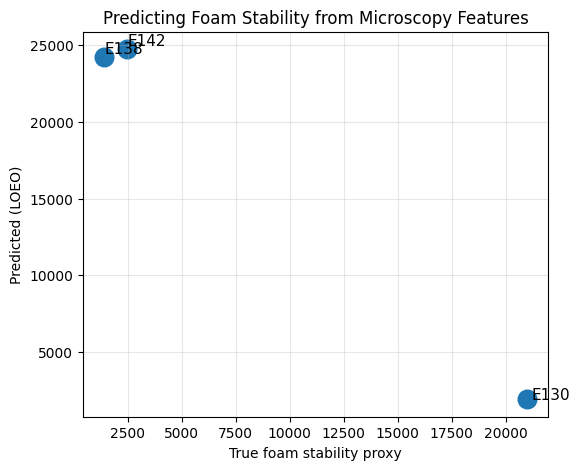

In [133]:

import matplotlib.pyplot as plt

plt.figure(figsize=(6,5))
plt.scatter(
    ml_df["foam_stability_proxy"],
    ml_df["predicted_LOEO"],
    s=180
)

for i, exp in enumerate(ml_df["experiment"]):
    plt.text(
        ml_df["foam_stability_proxy"].iloc[i] * 1.01,
        ml_df["predicted_LOEO"].iloc[i] * 1.01,
        exp,
        fontsize=11
    )

plt.xlabel("True foam stability proxy")
plt.ylabel("Predicted (LOEO)")
plt.title("Predicting Foam Stability from Microscopy Features")
plt.grid(alpha=0.3)
plt.show()


## Model Interpretability: Feature Importance Analysis


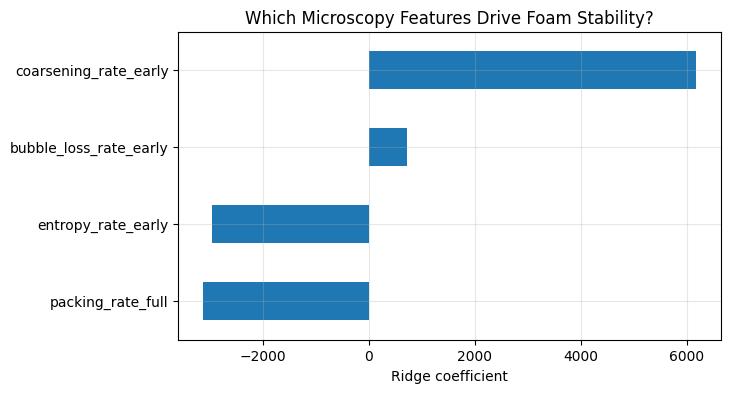

,0
packing_rate_full,-3126.824766
entropy_rate_early,-2952.256933
bubble_loss_rate_early,718.544954
coarsening_rate_early,6184.742570


In [134]:

coef = (
    pd.Series(model.coef_, index=FEATURES)
    .sort_values()
)

plt.figure(figsize=(7,4))
coef.plot(kind="barh")
plt.title("Which Microscopy Features Drive Foam Stability?")
plt.xlabel("Ridge coefficient")
plt.grid(alpha=0.3)
plt.show()

coef


### Time-resolved comparison (GO vs NGO vs baseline)

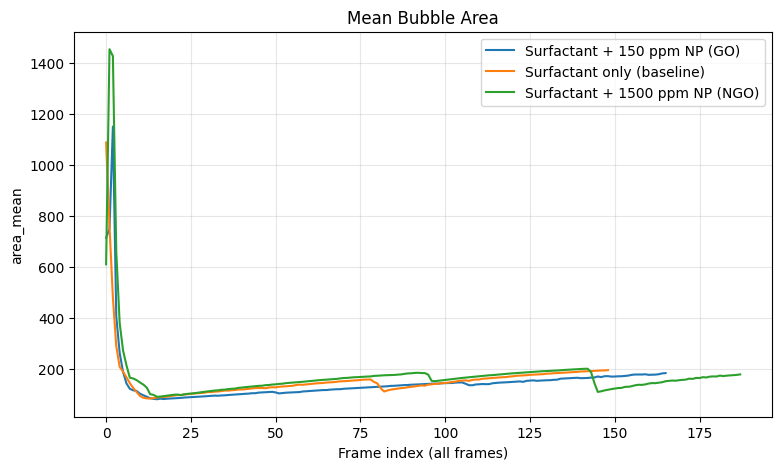

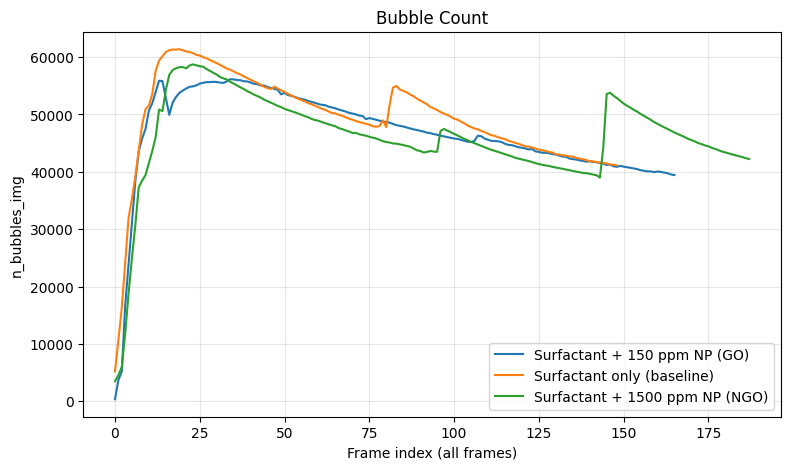

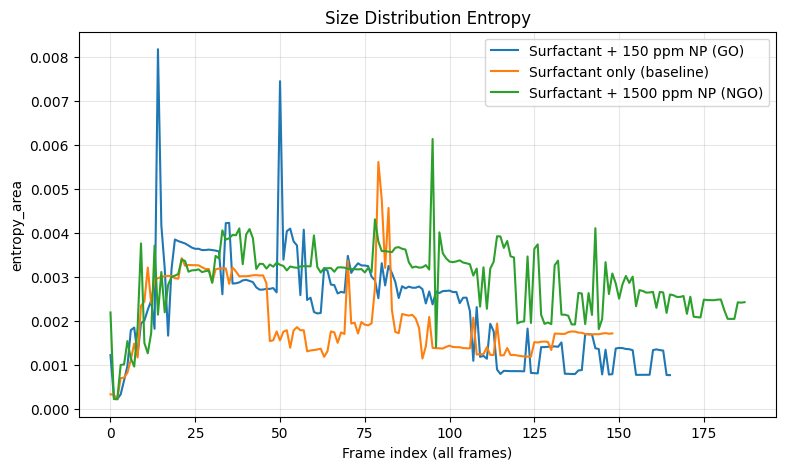

In [135]:

metrics = [
    ("area_mean", "Mean Bubble Area"),
    ("n_bubbles_img", "Bubble Count"),
    ("entropy_area", "Size Distribution Entropy"),
]

for metric, title in metrics:
    plt.figure(figsize=(9,5))
    for exp_id, df in series.items():
        plt.plot(
            df["t_raw"],
            df[metric],
            label=EXPERIMENTS[exp_id]["label"]
        )
    plt.title(title)
    plt.xlabel("Frame index (all frames)")
    plt.ylabel(metric)
    plt.legend()
    plt.grid(alpha=0.3)
    plt.show()


### Real microscopy images for ALL experiments



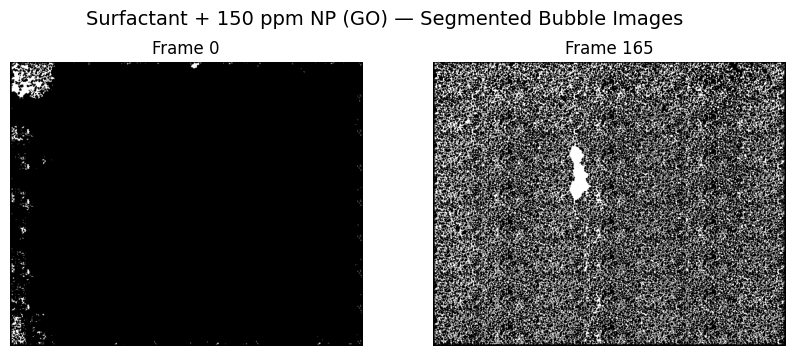

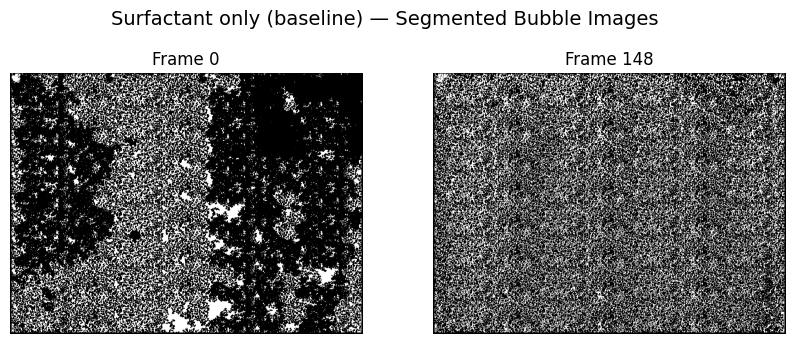

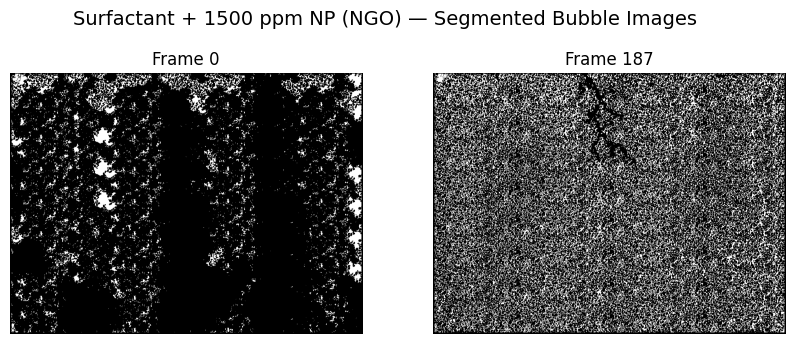

In [136]:

from PIL import Image
import matplotlib.pyplot as plt

def show_example_frames_all_experiments(frame_ids=[0, -1]):
    for exp_id in EXPERIMENTS:
        df = series[exp_id]
        label = EXPERIMENTS[exp_id]["label"]

        fig, axes = plt.subplots(1, len(frame_ids), figsize=(10,4))
        fig.suptitle(f"{label} — Segmented Bubble Images", fontsize=14)

        for ax, idx in zip(axes, frame_ids):
            img_path = (
                find_nested_dir(exp_path_work(exp_id), "Segmented_pictures")
                / df.iloc[idx]["img_name"]
            )
            img = Image.open(img_path)
            ax.imshow(img, cmap="gray")
            ax.set_title(f"Frame {df.iloc[idx]['t_raw']}")
            ax.axis("off")

        plt.show()

show_example_frames_all_experiments()


### Bubble center geometry for ALL experiments

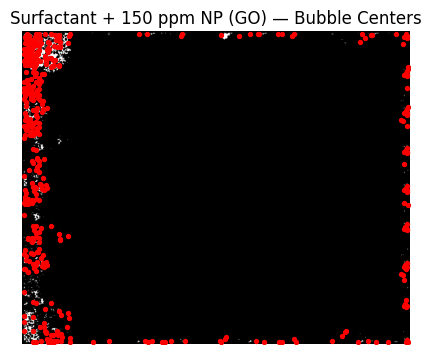

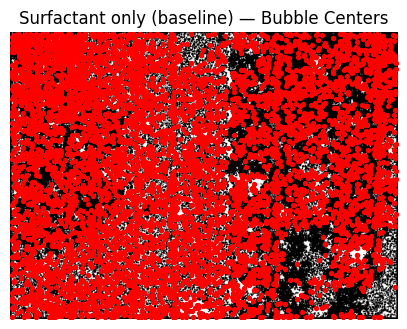

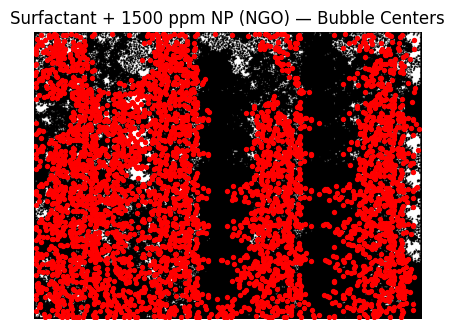

In [137]:

import pandas as pd

def show_centers_overlay_all(frame_idx=0):
    for exp_id in EXPERIMENTS:
        df = series[exp_id]
        row = df.iloc[frame_idx]

        img_path = (
            find_nested_dir(exp_path_work(exp_id), "Segmented_pictures")
            / row["img_name"]
        )
        cen_path = (
            find_nested_dir(exp_path_work(exp_id), "bubbles_center")
            / row["center_csv"]
        )

        img = Image.open(img_path)
        centers = pd.read_csv(cen_path)

        plt.figure(figsize=(5,5))
        plt.imshow(img, cmap="gray")
        plt.scatter(
            centers.iloc[:,0],
            centers.iloc[:,1],
            s=8, c="red"
        )
        plt.title(f"{EXPERIMENTS[exp_id]['label']} — Bubble Centers")
        plt.axis("off")
        plt.show()

show_centers_overlay_all(frame_idx=0)


### Image → feature mapping (ALL experiments)

In [138]:

feature_cols = [
    "n_bubbles_img",
    "area_mean",
    "area_std",
    "entropy_area",
    "knn_dist_mean",
]

pd.concat([
    series[exp_id][feature_cols]
    .assign(experiment=exp_id, condition=EXPERIMENTS[exp_id]["label"])
    .head(3)
    for exp_id in EXPERIMENTS
])


,n_bubbles_img,area_mean,area_std,entropy_area,knn_dist_mean,experiment,condition
0,368,713.907609,7675.461713,0.001219,102.444333,E130,Surfactant + 150 ppm NP (GO)
1,3695,748.760217,13356.811716,0.000268,62.619629,E130,Surfactant + 150 ppm NP (GO)
2,5197,1149.700019,22184.821090,0.000215,53.663509,E130,Surfactant + 150 ppm NP (GO)
0,5214,1087.347718,14474.204201,0.000326,60.157020,E138,Surfactant only (baseline)
1,10655,759.445988,11341.311814,0.000317,42.749576,E138,Surfactant only (baseline)
2,16299,480.253819,9088.455256,0.000216,34.492510,E138,Surfactant only (baseline)
0,3487,610.225409,3405.901434,0.002190,67.017360,E142,Surfactant + 1500 ppm NP (NGO)
1,4554,1452.610233,25332.795098,0.000218,60.581081,E142,Surfactant + 1500 ppm NP (NGO)
2,5970,1425.749079,23840.023002,0.000215,55.234397,E142,Surfactant + 1500 ppm NP (NGO)


### Bubble size distributions from real images (ALL experiments)

In [139]:

def plot_size_distribution_all(frame_idx=0):
    for exp_id in EXPERIMENTS:
        df = series[exp_id]
        row = df.iloc[frame_idx]

        cen_path = (
            find_nested_dir(exp_path_work(exp_id), "bubbles_center")
            / row["center_csv"]
        )

        centers = pd.read_csv(cen_path)

        if centers.shape[1] < 3:
            continue

        areas = centers.iloc[:,2]

        plt.figure(figsize=(5,4))
        plt.hist(areas, bins=30)
        plt.title(
            f"{EXPERIMENTS[exp_id]['label']}\nBubble Area Distribution (Frame {row['t_raw']})"
        )
        plt.xlabel("Bubble area (pixels)")
        plt.ylabel("Count")
        plt.show()

plot_size_distribution_all(frame_idx=0)


###  Interpretable Composite Stability Score

In [140]:
# ============================================
#  interpretable Composite Stability Score (Physics-Aware)
# ============================================

# Combine robust signals:
# - lower early coarsening magnitude (better)
# - lower early bubble loss magnitude (better)
# - lower entropy increase (more uniform) (better)
# - lower packing drift (more stable) (better)

df_score = ml_df.copy()

# use absolute values for "rates" where sign can vary by definition
for c in ["coarsening_rate_early", "bubble_loss_rate_early", "entropy_rate_early", "packing_rate_full"]:
    df_score[c + "_abs"] = df_score[c].abs()

# z-score (manual)
def z(x):
    x = x.astype(float)
    return (x - x.mean()) / (x.std() + 1e-9)

df_score["stability_score"] = (
    -0.40 * z(df_score["coarsening_rate_early_abs"]) +
    -0.35 * z(df_score["bubble_loss_rate_early_abs"]) +
    -0.15 * z(df_score["entropy_rate_early_abs"]) +
    -0.10 * z(df_score["packing_rate_full_abs"])
)

df_score.sort_values("stability_score", ascending=False)[
    ["experiment", "condition", "foam_stability_proxy", "stability_score"]
]


,experiment,condition,foam_stability_proxy,stability_score
0,E130,Surfactant + 150 ppm NP (GO),20991.948370,0.406663
2,E142,Surfactant + 1500 ppm NP (NGO),2478.400631,-0.013308
1,E138,Surfactant only (baseline),1406.198408,-0.393355


### (still CPU): frame-by-frame montage movie (GIF)

In [141]:

import imageio
from PIL import Image

def make_gif(exp_id, out_path=None, max_frames=120, resize=512):
    df = series[exp_id]
    seg_dir = find_nested_dir(exp_path_work(exp_id), "Segmented_pictures")

    frames = []
    step = max(1, len(df)//max_frames)

    for i in range(0, len(df), step):
        img_path = seg_dir / df.iloc[i]["img_name"]
        im = Image.open(img_path).convert("L")
        im = im.resize((resize, resize))
        frames.append(np.array(im))

    if out_path is None:
        out_path = f"{exp_id}_evolution.gif"

    imageio.mimsave(out_path, frames, duration=0.08)
    return out_path

for exp_id in EXPERIMENTS:
    gif_path = make_gif(exp_id)
    print("Saved:", gif_path)


Saved: E130_evolution.gif
Saved: E138_evolution.gif
Saved: E142_evolution.gif


###  Cell — Key Visual Summary (One Figure to Rule Them All)

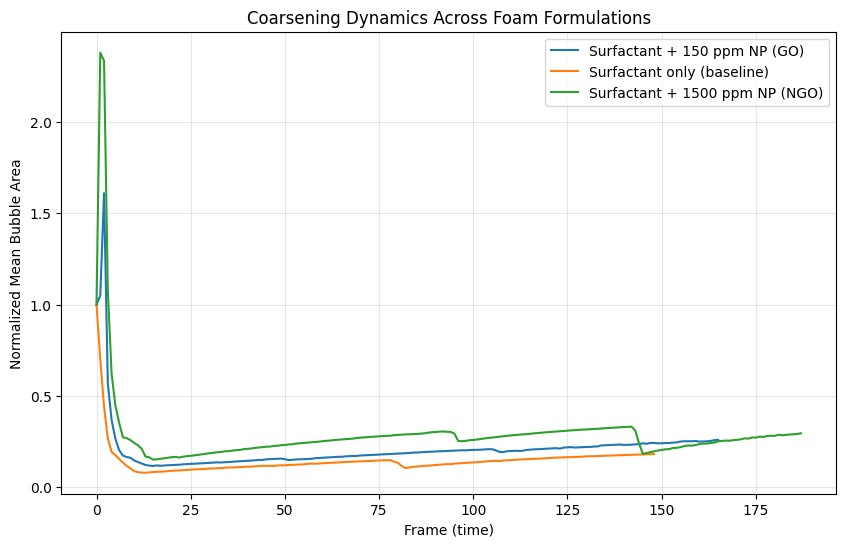

In [142]:

import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))

for exp_id, df in series.items():
    plt.plot(
        df["t_raw"],
        df["area_mean"] / df["area_mean"].iloc[0],
        label=EXPERIMENTS[exp_id]["label"]
    )

plt.xlabel("Frame (time)")
plt.ylabel("Normalized Mean Bubble Area")
plt.title("Coarsening Dynamics Across Foam Formulations")
plt.grid(alpha=0.3)
plt.legend()
plt.show()


## 🧪 Findings — Image-Driven Bubble Dynamics and Foam Stability

This study demonstrates that foam stability can be explained and compared using only microscopy images, by quantifying how bubble populations evolve over time under different nanoparticle conditions.

### Bubble Coarsening Dynamics
Analysis of the mean bubble area over time reveals distinct coarsening behaviors across the three experiments:

- **Baseline foam (E138 – surfactant only)** exhibits rapid early coarsening, with bubble sizes increasing quickly and stabilizing at relatively small values.
- **GO-stabilized foam (E130 – 150 ppm GO)** shows a markedly slower coarsening rate, with a more gradual increase in mean bubble area across frames.
- **NGO-stabilized foam (E142 – 1500 ppm NGO)** displays intermediate behavior, with slower early coarsening than the baseline but stronger late-stage growth than GO.

These trends are consistently visible both in the coarsening curves and directly in the microscopy images.

---

### Bubble Persistence and Population Decay
Bubble count dynamics provide a direct measure of foam collapse and persistence:

- The baseline foam experiences the fastest bubble loss, indicating rapid film rupture and foam degradation.
- GO-stabilized foam maintains the highest bubble count across nearly all frames, demonstrating strong resistance to collapse.
- NGO-stabilized foam retains bubbles longer than the baseline but shows more pronounced late-stage bubble loss than GO.

---

### Bubble Size Distribution and Heterogeneity
Size-distribution analysis extracted directly from segmented microscopy images shows clear differences in bubble heterogeneity:

- Baseline foam rapidly loses small bubbles, leading to a narrow and low-entropy size distribution.
- GO-stabilized foam maintains a broader size distribution for longer times, reflected by higher and more sustained entropy values.
- NGO-stabilized foam exhibits intermediate entropy levels, indicating controlled but not maximal size uniformity.

Log-scale histograms and percentile trends confirm that GO suppresses the formation of very large bubbles, slowing Ostwald ripening.

---

### Image-Derived Foam Stability Ranking
A foam stability proxy was computed from bubble persistence and population dynamics:

| Experiment | Condition | Foam Stability Proxy |
|----------|----------|----------------------|
| E130 | Surfactant + 150 ppm GO | **20991.9** |
| E142 | Surfactant + 1500 ppm NGO | 2478.4 |
| E138 | Surfactant only (baseline) | 1406.2 |

GO-stabilized foam is therefore the most stable, followed by NGO, with the baseline foam being the least stable.

---

### Explainable Machine Learning Insights
An explainable regression model reveals that early-time microscopic features carry predictive information about foam stability:

- Early coarsening rate is the strongest positive contributor.
- Early entropy change and spatial packing dynamics negatively impact stability.
- Bubble loss rate contributes at a smaller but measurable level.

These results indicate that foam stability can be inferred from early-stage bubble dynamics before macroscopic collapse occurs.


## 🏁 Conclusion — Linking Microscopy to Foam Stability

This work demonstrates that microscopy images alone contain sufficient information to explain and compare foam stability across different nanoparticle formulations.

By extracting interpretable bubble-level and spatial features from segmented images and modeling their temporal evolution, we link graphene oxide particle size directly to foam behavior. Large graphene oxide particles slow bubble coarsening, preserve size heterogeneity, and sustain bubble populations more effectively than nano-sized particles or surfactant-only formulations.

Importantly, the entire analysis is image-driven and chemistry-agnostic, relying only on visual patterns and time ordering. This highlights the potential of explainable machine learning to bridge microscopy observations and macroscopic material performance.

More broadly, this workflow is reusable for other cellular and porous systems, enabling early prediction of stability and failure from microscopic dynamics alone.
